# Chapter 17 - Exercises

In [1]:
library(tidyverse)
library(bayesrules)
library(bayesplot)
library(rstan)
library(rstanarm)
library(broom.mixed)
library(tidybayes)
library(forcats)
library(lme4)
# use multiple cores, otherwise hierarchical models with random slopes and intercepts are terribly slow
options(mc.cores=parallel::detectCores()) 

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.2     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
This is bayesplot version 1.10.0

- Online documentation and vignettes at mc-stan.org/bayesplot

- bayesplot theme set to bayesplot::theme_default()

   * Does _not_ affect other ggplot2 plots

   * See ?bayesplot_theme_set for details on theme setting

Loading required package: StanHeaders

rstan (Version 2.21.8, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recomp

## Exercise 17.6

In [2]:
head( sleepstudy )

,Reaction,Days,Subject
,<dbl>,<dbl>,<fct>
1,249.5600,0,308
2,258.7047,1,308
3,250.8006,2,308
4,321.4398,3,308
5,356.8519,4,308
6,414.6901,5,308


In [3]:
dim( sleepstudy )

[1] 180   3

In [4]:
sleepstudy  %>% summarize( subjects=n_distinct(Subject) )

subjects
<int>
18


### a)

We should group by the subject of the experiment. Since we expect that average reaction time differs from subject to subject, we should incorporate this information.

### b)

See exercises 17.1 (b) and (a)

###  c)

Model 1 assumes that the slope of the decline (increase) of reaction time with the number of sleep-deprived days is the same for all subjects (by fixing a global slope). Model 2 does not make this assumption - the slope of the decline of reaction time is individual to the subject.

### d)

`geom_smooth()` using formula = 'y ~ x'


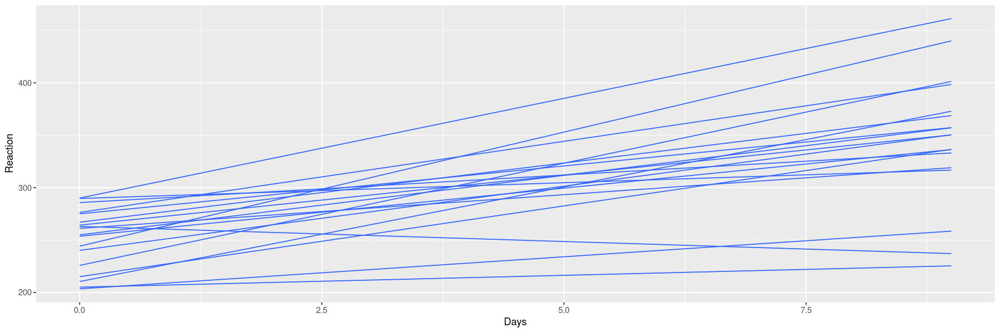

In [5]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot(sleepstudy, aes(x=Days, y=Reaction, group=Subject)) + 
    geom_smooth(method="lm", se=FALSE, linewidth=0.5)

The variance within the slopes for the individual slopes is significant, but not very large. In view of the very small amount of different subjects (18), model 1 might perform better.

## Exercise 17.7

### a)

Model 1:

In [6]:
sleep_model_1 <- stan_glmer(
  Reaction ~ Days + (1 | Subject), 
  data = sleepstudy, family = gaussian,
  prior_intercept = normal(250, 10, autoscale = TRUE),
  prior = normal(0, 1, autoscale = TRUE), 
  prior_aux = exponential(1, autoscale = TRUE),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1),
  chains = 4, iter = 5000*2, seed = 84735
)

MCMC diagnostics:

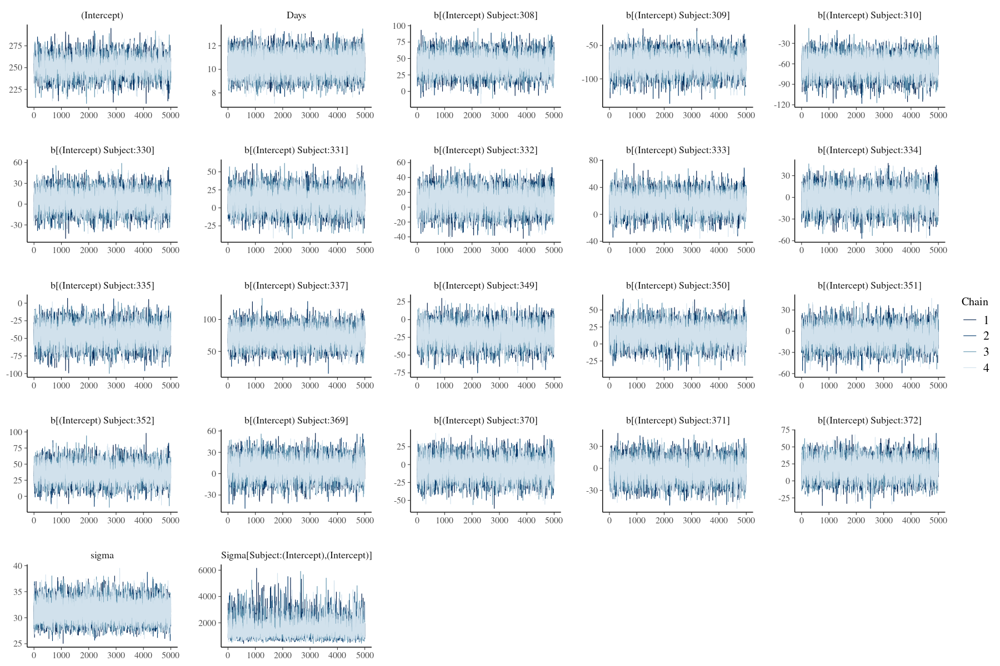

(Intercept)                                   Days 
                               0.14215                                0.84515 
            b[(Intercept) Subject:308]             b[(Intercept) Subject:309] 
                               0.24160                                0.23105 
            b[(Intercept) Subject:310]             b[(Intercept) Subject:330] 
                               0.22830                                0.21910 
            b[(Intercept) Subject:331]             b[(Intercept) Subject:332] 
                               0.22415                                0.21950 
            b[(Intercept) Subject:333]             b[(Intercept) Subject:334] 
                               0.22085                                0.21560 
            b[(Intercept) Subject:335]             b[(Intercept) Subject:337] 
                               0.23670                                0.22930 
            b[(Intercept) Subject:349]             b[(Intercept) Subject:350] 
                               0.22030                                0.23010 
            b[(Intercept) Subject:351]             b[(Intercept) Subject:352] 
                               0.22250                                0.22820 
            b[(Intercept) Subject:369]             b[(Intercept) Subject:370] 
                               0.21445                                0.21545 
            b[(Intercept) Subject:371]             b[(Intercept) Subject:372] 
                               0.21495                                0.21840 
                                 sigma Sigma[Subject:(Intercept),(Intercept)] 
                               0.62230                                0.20645

(Intercept)                                   Days 
                             1.0008266                              1.0000622 
            b[(Intercept) Subject:308]             b[(Intercept) Subject:309] 
                             1.0005300                              1.0008303 
            b[(Intercept) Subject:310]             b[(Intercept) Subject:330] 
                             1.0012993                              1.0005670 
            b[(Intercept) Subject:331]             b[(Intercept) Subject:332] 
                             1.0005365                              1.0009584 
            b[(Intercept) Subject:333]             b[(Intercept) Subject:334] 
                             1.0003935                              1.0003211 
            b[(Intercept) Subject:335]             b[(Intercept) Subject:337] 
                             1.0007087                              1.0003869 
            b[(Intercept) Subject:349]             b[(Intercept) Subject:350] 
                             1.0008875                              1.0005332 
            b[(Intercept) Subject:351]             b[(Intercept) Subject:352] 
                             1.0005065                              1.0007258 
            b[(Intercept) Subject:369]             b[(Intercept) Subject:370] 
                             1.0009726                              1.0006479 
            b[(Intercept) Subject:371]             b[(Intercept) Subject:372] 
                             1.0006001                              1.0007109 
                                 sigma Sigma[Subject:(Intercept),(Intercept)] 
                             0.9998991                              1.0016015

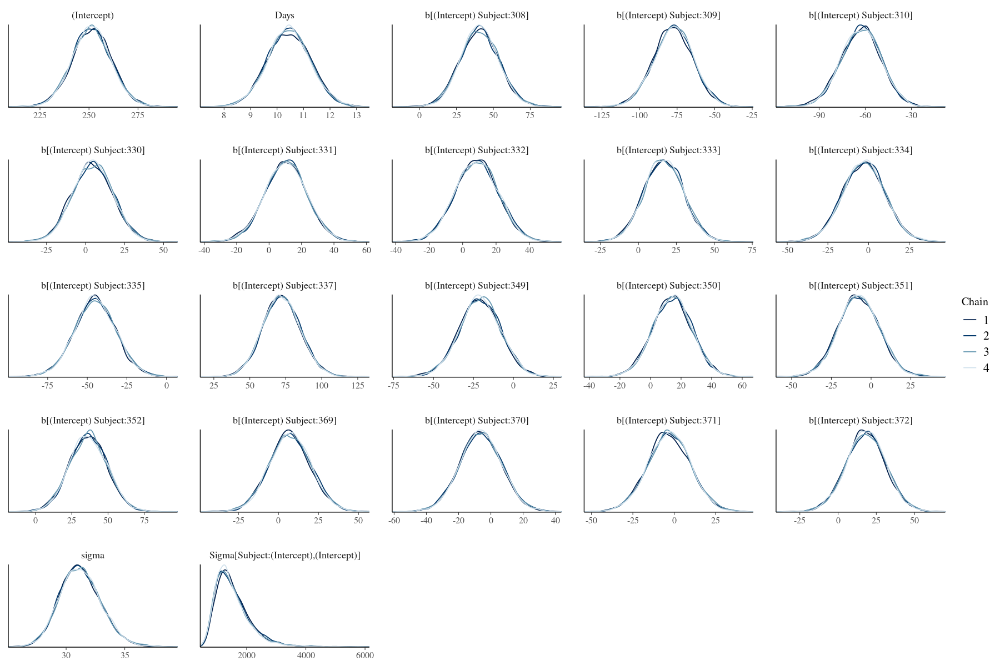

In [7]:
options(repr.plot.width=15, repr.plot.height=10)
mcmc_trace(sleep_model_1)
mcmc_dens_overlay(sleep_model_1)
neff_ratio(sleep_model_1)
rhat(sleep_model_1)

Looks good!

Model 2:

In [8]:
sleep_model_2 <- stan_glmer(
  Reaction ~ Days + (Days | Subject), 
  data = sleepstudy, family = gaussian,
  prior_intercept = normal(250, 10, autoscale = TRUE),
  prior = normal(0, 1, autoscale = TRUE), 
  prior_aux = exponential(1, autoscale = TRUE),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1),
  chains = 4, iter = 5000*2, seed = 84735
)

MCMC diagnostics:

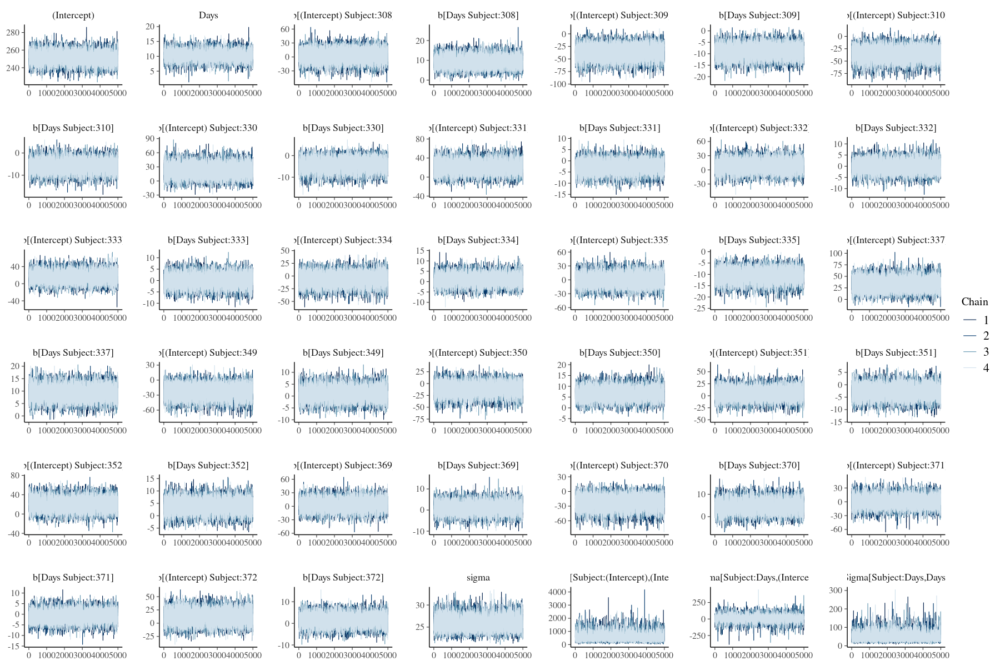

(Intercept)                                   Days 
                               0.55455                                0.36975 
            b[(Intercept) Subject:308]                    b[Days Subject:308] 
                               0.73210                                0.55325 
            b[(Intercept) Subject:309]                    b[Days Subject:309] 
                               0.98435                                0.73570 
            b[(Intercept) Subject:310]                    b[Days Subject:310] 
                               0.92715                                0.67610 
            b[(Intercept) Subject:330]                    b[Days Subject:330] 
                               0.69800                                0.56885 
            b[(Intercept) Subject:331]                    b[Days Subject:331] 
                               0.72440                                0.57740 
            b[(Intercept) Subject:332]                    b[Days Subject:332] 
                               0.91605                                0.65420 
            b[(Intercept) Subject:333]                    b[Days Subject:333] 
                               0.90815                                0.65305 
            b[(Intercept) Subject:334]                    b[Days Subject:334] 
                               0.87285                                0.63070 
            b[(Intercept) Subject:335]                    b[Days Subject:335] 
                               0.62650                                0.53725 
            b[(Intercept) Subject:337]                    b[Days Subject:337] 
                               0.91165                                0.72120 
            b[(Intercept) Subject:349]                    b[Days Subject:349] 
                               0.78350                                0.58590 
            b[(Intercept) Subject:350]                    b[Days Subject:350] 
                               0.68095                                0.52300 
            b[(Intercept) Subject:351]                    b[Days Subject:351] 
                               0.84750                                0.65170 
            b[(Intercept) Subject:352]                    b[Days Subject:352] 
                               0.98540                                0.66380 
            b[(Intercept) Subject:369]                    b[Days Subject:369] 
                               0.88490                                0.60920 
            b[(Intercept) Subject:370]                    b[Days Subject:370] 
                               0.66370                                0.54355 
            b[(Intercept) Subject:371]                    b[Days Subject:371] 
                               0.94915                                0.63030 
            b[(Intercept) Subject:372]                    b[Days Subject:372] 
                               1.00145                                0.62705 
                                 sigma Sigma[Subject:(Intercept),(Intercept)] 
                               0.77415                                0.46020 
       Sigma[Subject:Days,(Intercept)]               Sigma[Subject:Days,Days] 
                               0.26435                                0.44760

(Intercept)                                   Days 
                             1.0002123                              1.0001236 
            b[(Intercept) Subject:308]                    b[Days Subject:308] 
                             0.9999645                              1.0000335 
            b[(Intercept) Subject:309]                    b[Days Subject:309] 
                             0.9999603                              0.9999050 
            b[(Intercept) Subject:310]                    b[Days Subject:310] 
                             1.0000484                              0.9999332 
            b[(Intercept) Subject:330]                    b[Days Subject:330] 
                             1.0002208                              1.0002022 
            b[(Intercept) Subject:331]                    b[Days Subject:331] 
                             1.0000209                              1.0000979 
            b[(Intercept) Subject:332]                    b[Days Subject:332] 
                             0.9999691                              1.0001555 
            b[(Intercept) Subject:333]                    b[Days Subject:333] 
                             1.0000301                              0.9999849 
            b[(Intercept) Subject:334]                    b[Days Subject:334] 
                             1.0001363                              1.0000695 
            b[(Intercept) Subject:335]                    b[Days Subject:335] 
                             0.9999436                              1.0000817 
            b[(Intercept) Subject:337]                    b[Days Subject:337] 
                             1.0001182                              0.9998902 
            b[(Intercept) Subject:349]                    b[Days Subject:349] 
                             1.0001444                              1.0001081 
            b[(Intercept) Subject:350]                    b[Days Subject:350] 
                             1.0005492                              1.0001805 
            b[(Intercept) Subject:351]                    b[Days Subject:351] 
                             1.0000429                              1.0001450 
            b[(Intercept) Subject:352]                    b[Days Subject:352] 
                             0.9998652                              0.9999754 
            b[(Intercept) Subject:369]                    b[Days Subject:369] 
                             1.0002860                              0.9999583 
            b[(Intercept) Subject:370]                    b[Days Subject:370] 
                             1.0000825                              1.0000108 
            b[(Intercept) Subject:371]                    b[Days Subject:371] 
                             0.9999795                              1.0000624 
            b[(Intercept) Subject:372]                    b[Days Subject:372] 
                             1.0000380                              1.0000320 
                                 sigma Sigma[Subject:(Intercept),(Intercept)] 
                             1.0002949                              1.0003419 
       Sigma[Subject:Days,(Intercept)]               Sigma[Subject:Days,Days] 
                             1.0001894                              1.0002734

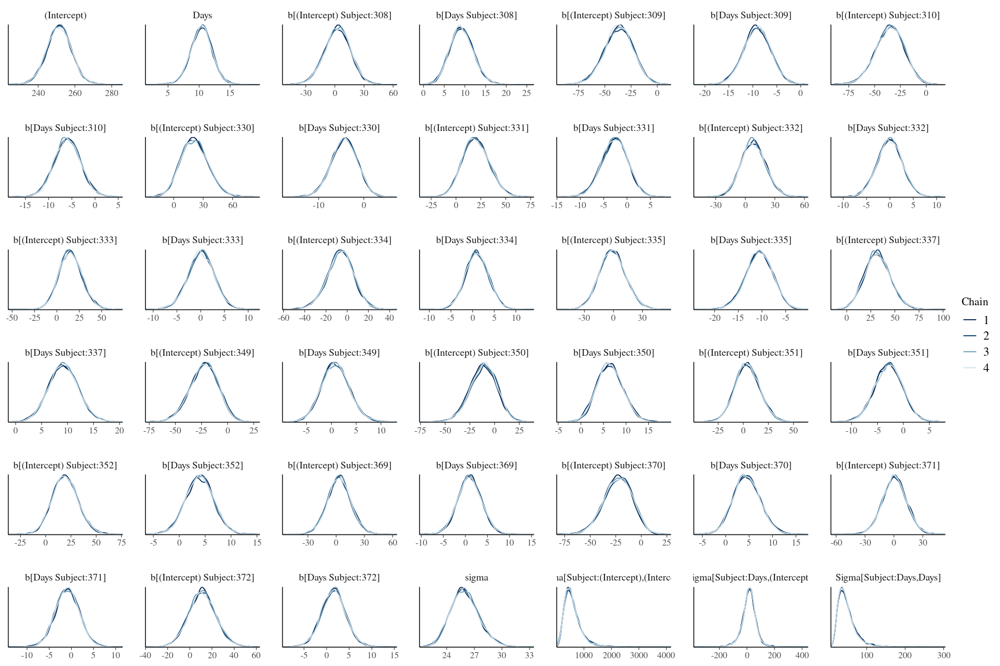

In [9]:
options(repr.plot.width=15, repr.plot.height=10)
mcmc_trace(sleep_model_2)
mcmc_dens_overlay(sleep_model_2)
neff_ratio(sleep_model_2)
rhat(sleep_model_2)

Looks good!

### b)

In [10]:
tidy(sleep_model_2, effects = "fixed", conf.int = TRUE, conf.level = 0.80)

term,estimate,std.error,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),251.43752,6.560464,242.769578,259.98264
Days,10.40532,1.687297,8.167352,12.55381


Posterior median regression model:

Reaction in $\mu$s = 251.4 + 10.4 * Days

### c)

Get posterior samples:

In [11]:
set.seed(84735)
sleep_chains_2 <- sleep_model_2 %>%
    spread_draws(`(Intercept)`, b[term, Subject], `Days`) %>% 
    pivot_wider(names_from = term, names_glue = "b_{term}", values_from = b) %>% 
    mutate(subject_intercept = `(Intercept)` + `b_(Intercept)`, subject_Days = Days+b_Days)

head( sleep_chains_2 )

.chain,.iteration,.draw,(Intercept),Subject,Days,b_(Intercept),b_Days,subject_intercept,subject_Days
<int>,<int>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,1,251.3246,Subject:308,9.111127,10.30740,9.7072159,261.6320,18.818343
1,1,1,251.3246,Subject:309,9.111127,-32.91128,-7.4075791,218.4133,1.703548
1,1,1,251.3246,Subject:310,9.111127,-50.59694,-1.1558622,200.7276,7.955265
1,1,1,251.3246,Subject:330,9.111127,30.11841,-2.6720126,281.4430,6.439114
1,1,1,251.3246,Subject:331,9.111127,15.74251,0.5656770,267.0671,9.676804
1,1,1,251.3246,Subject:332,9.111127,19.96727,-0.7068745,271.2919,8.404252


80% credible intervals for Days regression coefficient for each subject:

In [12]:
sleep_chains_2  %>% 
    group_by( Subject ) %>% 
    summarize( Days_lower=quantile(subject_Days, 0.1), Days_upper=quantile(subject_Days, 0.9) ) %>% 
    arrange( Subject )

Subject,Days_lower,Days_upper
<chr>,<dbl>,<dbl>
Subject:308,16.524135,22.819969
Subject:309,-1.911605,4.418053
Subject:310,1.242503,7.654293
Subject:330,2.750641,9.210461
Subject:331,4.523106,10.821231
Subject:332,7.360013,13.257076
Subject:333,7.424049,13.463109
Subject:334,8.495609,14.362475
Subject:335,-3.498164,2.962450


### d)

In [13]:
tidy(sleep_model_2, effects = "ran_pars")

term,group,estimate
<chr>,<chr>,<dbl>
sd_(Intercept).Subject,Subject,24.20655929
sd_Days.Subject,Subject,6.91446511
cor_(Intercept).Days.Subject,Subject,0.08132467
sd_Observation.Residual,Residual,25.97541320


$\sigma_y \approx 26.0$, $\sigma_0 \approx 24.2$, $\sigma_1 \approx 6.9$, $\rho \approx 0.08$

Per measurement, the reaction times vary with a standard deviation of 26 $\mu$s. The model intercept ($\sigma_0$) explains much more of the variance (93.4%) than the slope coefficient:

In [14]:
pi0 = 26^2/(26^2+6.9^2)
pi0

[1] 0.9342049

In [15]:
pi1 = 6.9^2/(26^2+6.9^2)
pi1

[1] 0.06579511

The correlation between intercept and slope is moderatly positive, indicating that people with higher baseline reaction times respond more strongly to sleep deprivation.

## Exercise 17.8

### a)

Posterior median regression models:

In [16]:
sleep_chains_2  %>% 
    group_by( Subject ) %>% 
    summarize( beta0=median(subject_intercept), beta1=median(subject_Days) ) %>% 
    arrange( beta1 )

Subject,beta0,beta1
<chr>,<dbl>,<dbl>
Subject:335,250.3482,-0.2116396
Subject:309,214.6996,1.2428889
Subject:310,216.1619,4.4109275
Subject:330,272.3174,6.0482060
Subject:351,255.3197,7.5636197
Subject:331,271.1705,7.7641621
Subject:371,252.0949,9.4645675
Subject:332,259.3030,10.3602429
Subject:333,266.4585,10.5063303


It appears that Subject 335 even improved slightly with sleep deprivation:

Reaction = 250.3 - 0.21 * Days

`geom_smooth()` using formula = 'y ~ x'


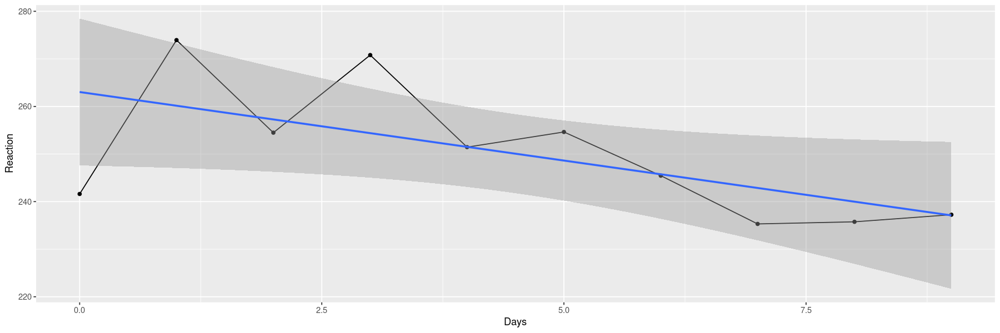

In [17]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot( sleepstudy %>% filter(Subject==335), aes(x=Days, y=Reaction) ) + 
    geom_line() + 
    geom_point() +
    geom_smooth( method="lm" )

(notice the shrinkage)

### b)

Subject 308: Reaction =254.3 + 19.6*Days

`geom_smooth()` using formula = 'y ~ x'


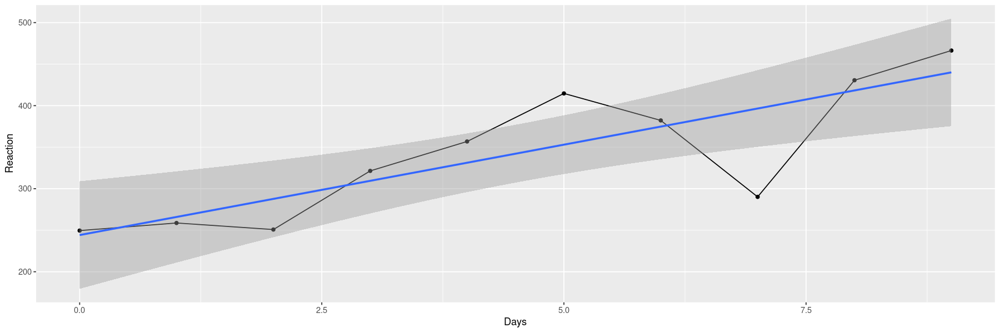

In [18]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot( sleepstudy %>% filter(Subject==308), aes(x=Days, y=Reaction) ) + 
    geom_line() + 
    geom_point() +
    geom_smooth( method="lm" )

### c)

In [19]:
sleep_chains_2  %>% 
    group_by( Subject ) %>% 
    summarize( beta0=median(subject_intercept), beta1=median(subject_Days) ) %>% 
    arrange( beta0 )

Subject,beta0,beta1
<chr>,<dbl>,<dbl>
Subject:309,214.6996,1.2428889
Subject:310,216.1619,4.4109275
Subject:370,228.8690,14.8111600
Subject:349,229.0533,11.1931523
Subject:350,240.2559,16.7603131
Subject:334,245.2800,11.3734917
Subject:335,250.3482,-0.2116396
Subject:371,252.0949,9.4645675
Subject:308,254.3059,19.5936416


Subject 337: Reaction = 283.3 + 19.6 * Days

`geom_smooth()` using formula = 'y ~ x'


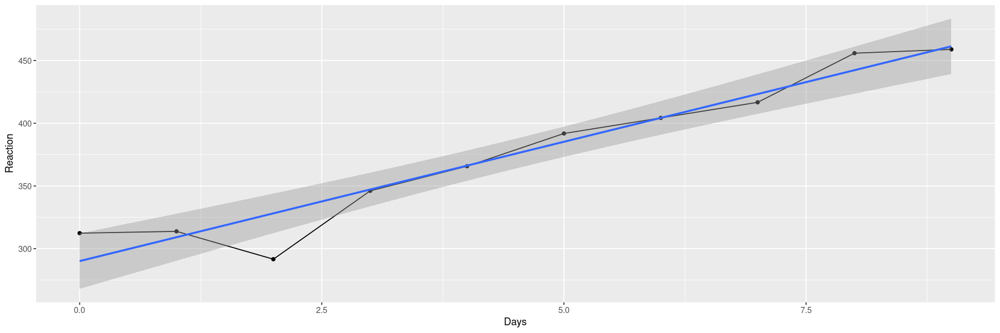

In [20]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot( sleepstudy %>% filter(Subject==337), aes(x=Days, y=Reaction) ) + 
    geom_line() + 
    geom_point() +
    geom_smooth( method="lm" )

### d)

Subject 309: Reaction = 214.7 + 1.24 * Days

`geom_smooth()` using formula = 'y ~ x'


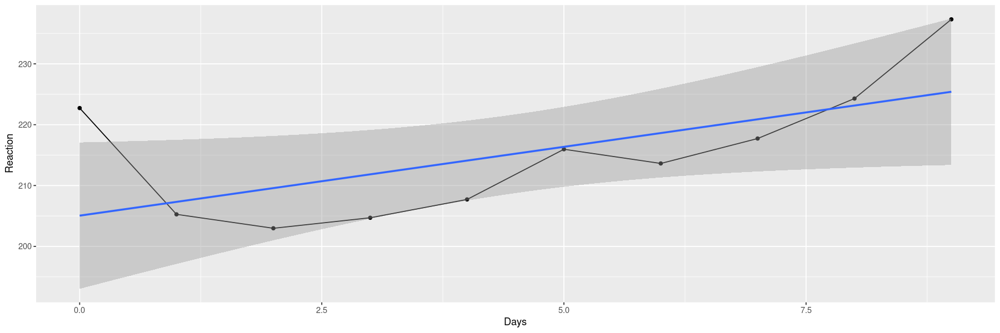

In [21]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot( sleepstudy %>% filter(Subject==309), aes(x=Days, y=Reaction) ) + 
    geom_line() + 
    geom_point() +
    geom_smooth( method="lm" )

### e)

Without `posterior_predict()` for subject 308:

In [22]:
set.seed(84735)
sleep_model_2_df <- data.frame( sleep_model_2 ) 
sleep_model_2_df %>% 
    transmute( 
        subject_intercept = X.Intercept.+b..Intercept..Subject.308.,
        subject_slope = Days+b.Days.Subject.308.,
        sigma_y = sigma
    ) %>% 
    mutate( mu = subject_intercept+5*subject_slope ) %>% 
    mutate( ynew = rnorm(nrow(sleep_model_2_df), mean=mu, sd=sigma_y) ) %>% 
    summarize( ynew_median=median(ynew), ynew_lower=quantile(ynew, 0.1), ynew_upper=quantile(ynew, 0.9))

ynew_median,ynew_lower,ynew_upper
<dbl>,<dbl>,<dbl>
351.7238,317.564,387.0963


Doing this for a new subject is a bit more involved (extracting covariance matrix coefficients and sampling from multivariate normal distribution), I leave this up to you.

With `posterior_predict()`:

In [23]:
predict_reaction_5days <- posterior_predict(
  sleep_model_2, 
  newdata = data.frame(Subject = c("308", "myself"), Days = c(5,5))
)

Median values:

In [24]:
data.frame( predict_reaction_5days ) %>% 
    rename( subject_308=X1, myself=X2 ) %>% 
    summarize_all( median )

subject_308,myself
<dbl>,<dbl>
352.1544,303.5474


Distributions:

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


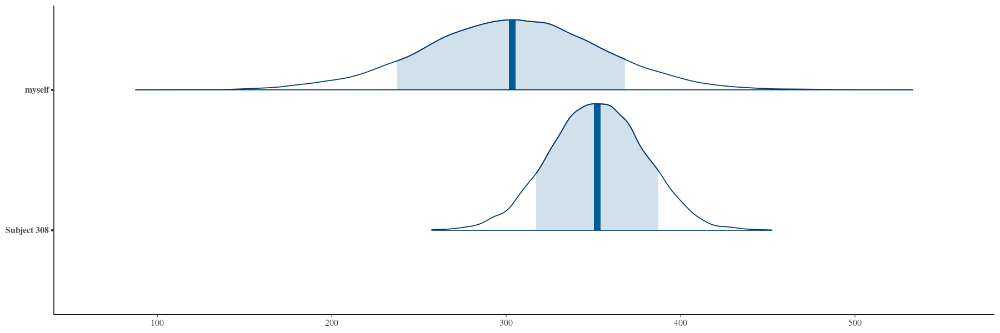

In [25]:
mcmc_areas(predict_reaction_5days, prob = 0.8) +
 ggplot2::scale_y_discrete(labels = c("Subject 308", "myself"))

## Exercise 17.9

### a)

Are they wrong?

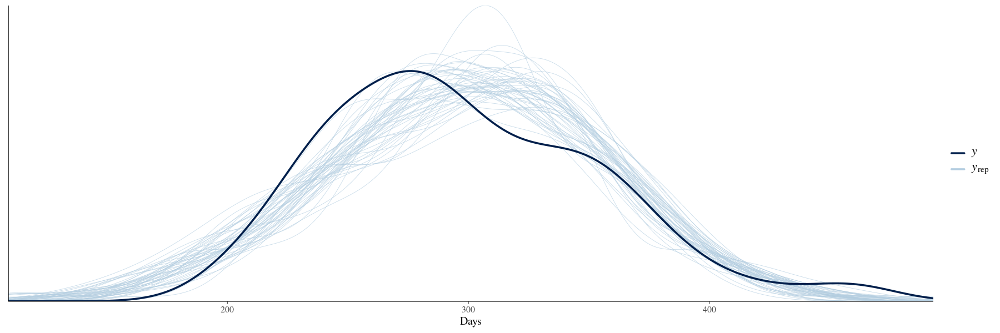

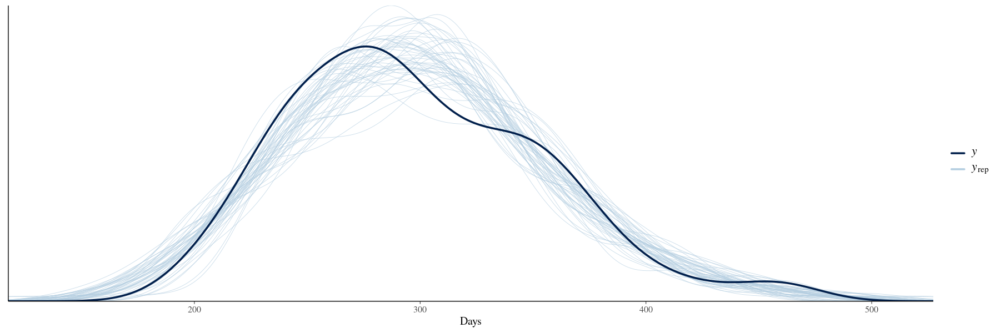

In [26]:
pp_check(sleep_model_1) +
  xlab("Days")
pp_check(sleep_model_2) +
  xlab("Days")

Model 2 looks slightly better, but not much! Both are not perfect, not really capturing the skewness in the data.

Are they fair? Hopefully the subjects were not harmed in long-term by the study - they probably signed some sort of waiver anyway. I can't imagine how the results of the study could be used to discriminate somebody, the results are very general. So: The model appears to be fair.

How accurate are the posterior predictions?

In [27]:
prediction_summary(model = sleep_model_1, data = sleepstudy)

mae,mae_scaled,within_50,within_95
<dbl>,<dbl>,<dbl>,<dbl>
16.72788,0.5088383,0.6222222,0.9611111


In [28]:
prediction_summary(model = sleep_model_2, data = sleepstudy)

mae,mae_scaled,within_50,within_95
<dbl>,<dbl>,<dbl>,<dbl>
12.41765,0.4441526,0.7,0.9777778


Model 2 appears to be a bit better in median absolute error.

### b)

In [29]:
elpd1 <- loo(sleep_model_1, k_threshold=0.7)
elpd2 <- loo(sleep_model_2, k_threshold=0.7)
loo_compare(elpd1, elpd2)

All pareto_k estimates below user-specified threshold of 0.7. 
Returning loo object.

3 problematic observation(s) found.
Model will be refit 3 times.


Fitting model 1 out of 3 (leaving out observation 8)


Fitting model 2 out of 3 (leaving out observation 57)


Fitting model 3 out of 3 (leaving out observation 60)



,elpd_diff,se_diff,elpd_loo,se_elpd_loo,p_loo,se_p_loo,looic,se_looic
sleep_model_2,0.00000,0.00000,-862.7744,22.95068,34.85378,9.086965,1725.549,45.90137
sleep_model_1,-22.31285,12.18954,-885.0873,14.40168,19.54777,3.386203,1770.175,28.80337


-22.3 $\pm$ 2 * 12.2 = (-46.7, 2.1). An ELPD difference of zero is within two standard errors of the estimated difference. There is no strong evidence that model 2 is better than model 2, thus we should favour the less flexible model 1 (also in light of the limited amount of data).

Thus I prefer a hierarchical model with random intercepts, but slopes, i.e. I assume that all subjects react in the same way to sleep deprivation.

## Exercise 17.10

### a)

\begin{eqnarray*}
Y_{ij}|\beta_{0j},\beta_1,\sigma_y &\sim& N(\mu_{ij}, \sigma_y^2) \quad \text{with} \quad \mu_{ij} = \beta_{0j} + \beta_{1} X _{ij}\\
\beta_{0j} |\beta_0, \sigma_0 &\sim & N\left( \beta_0, \sigma_0^2 \right)\\
\beta_{0c} &=& N(m_0, s_0^2) \\
\beta_1 &=& N(0, s_1^2)\\
\sigma_y &=& \text{Exp}(l_y) \\
\sigma_0 &=& \text{Exp}(l_0)
\end{eqnarray*}

### b)

To interpret the coefficients, we have to make an assumption about the encoding of the two levels of $X_{ij}$. Let me assume that polite is the baseline. Then $\beta_{0j}$ is the mean polite pitch of subject $j$ and $\beta_0$ is the mean polite pitch among all the subjects.

### c) 

$\sigma_y$ is the within-group variance, i.e. the unexplained spread of polite pitch for one subject that is still remaining after fitting the linear model. $\sigma_0$ is the between-group variance, i.e. how much polite pitch varies between different subjects.

## Exercise 17.11

### a)

In [30]:
head( voices )

subject,scenario,attitude,pitch
<fct>,<fct>,<fct>,<dbl>
A,A,polite,229.7
A,A,informal,237.3
A,B,polite,236.8
A,B,informal,251.0
A,C,polite,267.0
A,C,informal,266.0


In [31]:
dim( voices )

[1] 84  4

Subjects:

In [32]:
voices %>% summarize( subjects=n_distinct(subject) )

subjects
<int>
6


This is a rather small number! It definitely makes sense to choose the simpler model.

Dialogs per subject:

In [33]:
voices %>% na.omit() %>% count( subject )

subject,n
<fct>,<int>
A,14
B,13
C,14
D,14
E,14
F,14


14 dialogs per subject (with one exception).

### b)

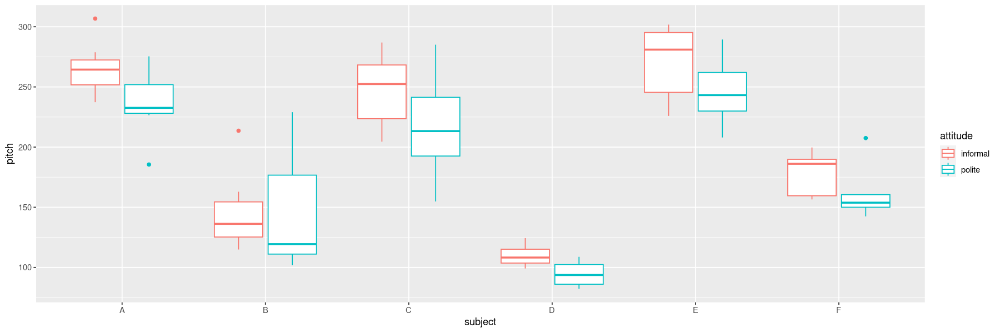

In [34]:
ggplot( voices %>% na.omit() ) + geom_boxplot( aes(x=subject, y=pitch, color=attitude) )

The between-group variance appears to be larger than the within-group variance (what makes sense, my pitch will not change so much that I sound like somebody else).

## Exercise 17.12

### a)

Simulate the model:

In [35]:
voice_model <- stan_glmer(
  pitch ~ attitude + (1 | subject), 
  data = voices, family = gaussian,
  prior_intercept = normal(250, 10, autoscale = TRUE),
  prior = normal(0, 1, autoscale = TRUE), 
  prior_aux = exponential(1, autoscale = TRUE),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1),
  chains = 4, iter = 5000*2, seed = 84735
)

Trace plot:

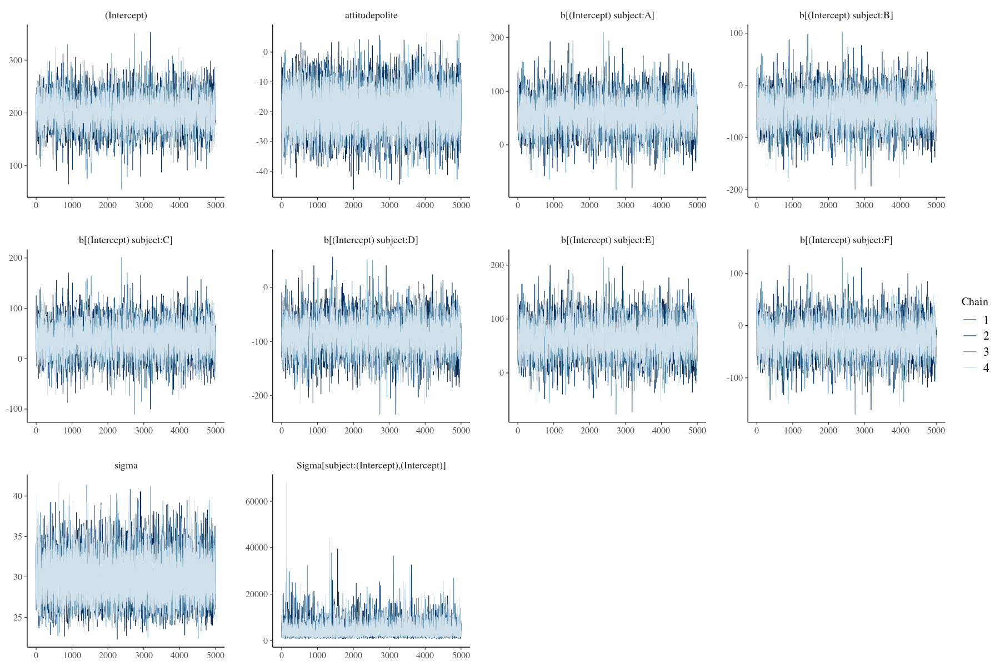

Warning message:
“The `facets` argument of `facet_grid()` is deprecated as of ggplot2 2.2.0.
ℹ Please use the `rows` argument instead.
ℹ The deprecated feature was likely used in the bayesplot package.
  Please report the issue at <https://github.com/stan-dev/bayesplot/issues/>.”


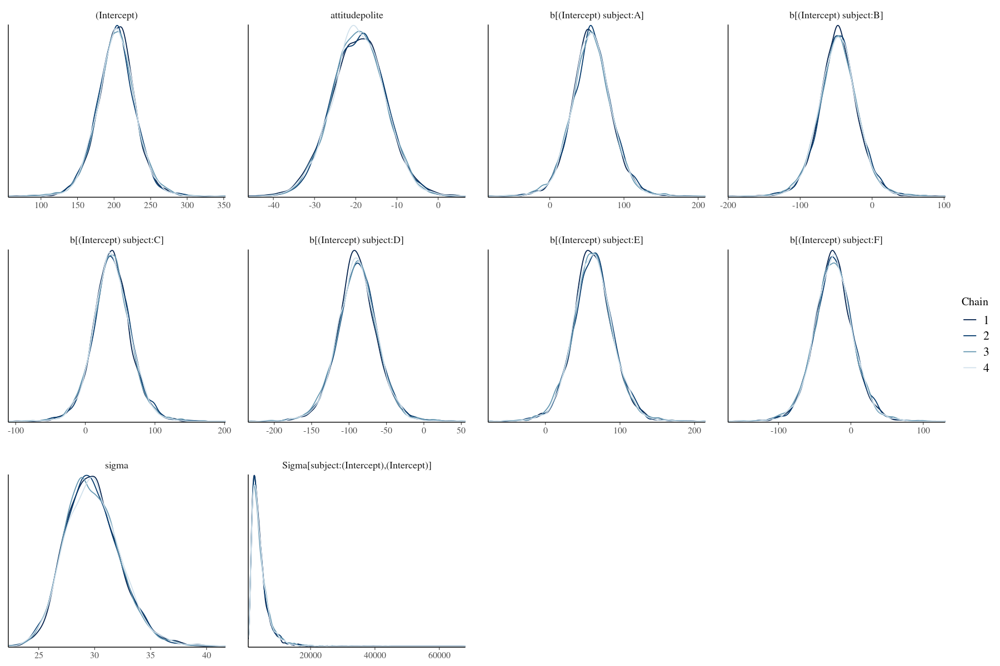

(Intercept)                         attitudepolite 
                               0.26280                                0.83170 
              b[(Intercept) subject:A]               b[(Intercept) subject:B] 
                               0.27190                                0.27590 
              b[(Intercept) subject:C]               b[(Intercept) subject:D] 
                               0.27375                                0.27585 
              b[(Intercept) subject:E]               b[(Intercept) subject:F] 
                               0.27395                                0.27165 
                                 sigma Sigma[subject:(Intercept),(Intercept)] 
                               0.67270                                0.36450

(Intercept)                         attitudepolite 
                             1.0005696                              0.9999039 
              b[(Intercept) subject:A]               b[(Intercept) subject:B] 
                             1.0005006                              1.0004803 
              b[(Intercept) subject:C]               b[(Intercept) subject:D] 
                             1.0005513                              1.0005178 
              b[(Intercept) subject:E]               b[(Intercept) subject:F] 
                             1.0004715                              1.0005675 
                                 sigma Sigma[subject:(Intercept),(Intercept)] 
                             1.0000222                              1.0012171

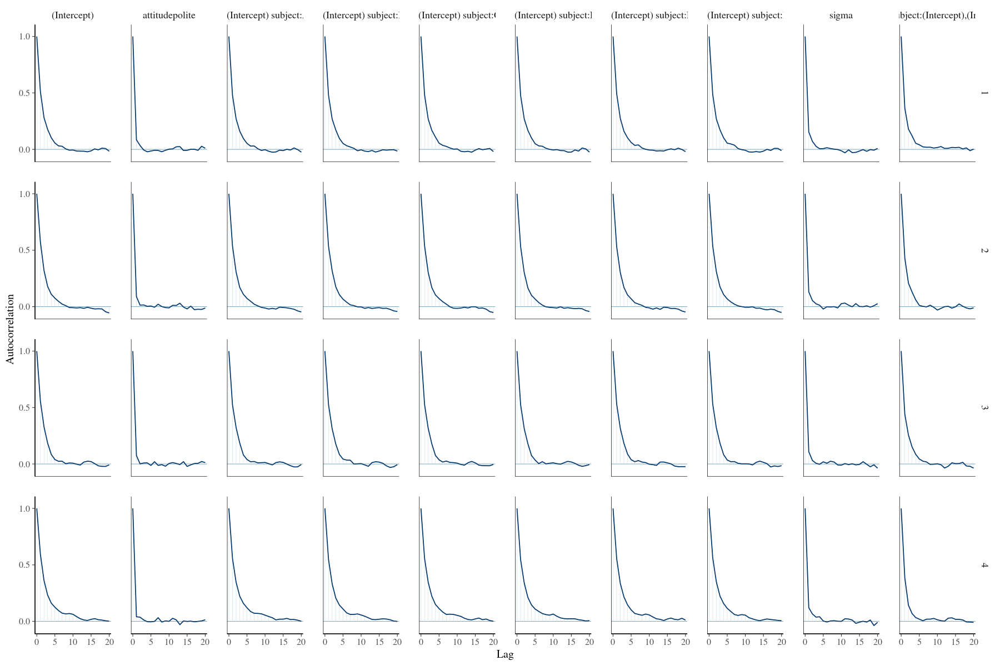

In [36]:
options(repr.plot.width=15, repr.plot.height=10)
mcmc_trace(voice_model)
mcmc_dens_overlay(voice_model)
mcmc_acf(voice_model)
neff_ratio(voice_model)
rhat(voice_model)

Looks good!

Posterior predictive check:

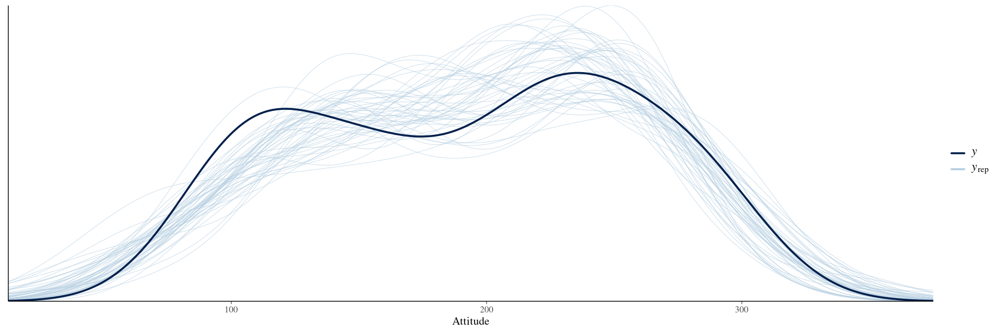

In [37]:
options(repr.plot.width=15, repr.plot.height=5)
pp_check(voice_model) + xlab("Attitude")

A lot of variance, but looks ok, no fundamental systematic error.

### b)

In [38]:
tidy(voice_model, effects = "fixed", conf.int = TRUE, conf.level = 0.95)

term,estimate,std.error,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),203.14649,24.600019,148.61465,256.131177
attitudepolite,-19.31093,6.427638,-32.14464,-6.691067


(notice that the baseline was chosen different than in the theoretical explanations above)

$\beta_0 \in [148.6,256.1]$

### c)

$\beta_1 \in [-32.1,-6.7]$

### d)

The 95% credible interval for $\beta_1$ is quite large, but does not contain 0, pitch appears therefore to be significantly correlated with attitude.

## Exercise 17.13

### a)

pitch = 203.1 - 19.31 * $X$

where $X = \left\{\begin{array}{cc} 0, & \text{informal}\\ 1, & \text{polite} \end{array} \right.$

### b)

In [39]:
subject_summary <- voice_model %>%
  spread_draws(`(Intercept)`, b[,subject]) %>% # extract dataframe
  mutate(subject_intercept = `(Intercept)` + b) %>% # compute individual runner intercepts
  select(-`(Intercept)`, -b) %>% # drop global intercept and b
  median_qi(.width = 0.80) %>%  # compute credible intervals
  select(subject, subject_intercept, .lower, .upper)

subject_summary

subject,subject_intercept,.lower,.upper
<chr>,<dbl>,<dbl>,<dbl>
subject:A,259.3522,248.3940,270.2947
subject:B,155.9381,144.8589,167.0996
subject:C,240.9517,230.1386,252.1316
subject:D,113.6184,102.7137,124.8820
subject:E,266.5357,255.6265,277.4952
subject:F,179.0661,168.1452,189.9411


subject A: pitch = 259.4 - 19.31 * $X$

subject B: pitch = 155.9 - 19.31 * $X$

### c)

In [40]:
set.seed(84735)
predict_new_scenario <- posterior_predict(
  voice_model, 
  newdata = data.frame(subject = c("A", "F", "myself"), attitude = c("polite","polite", "polite"))
)

Median values:

In [41]:
data.frame( predict_new_scenario ) %>% 
    rename( A=X1, B=X2, myself=X3 ) %>% 
    summarize_all( median )

A,B,myself
<dbl>,<dbl>,<dbl>
240.0855,159.5334,183.9078


Distributions:

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


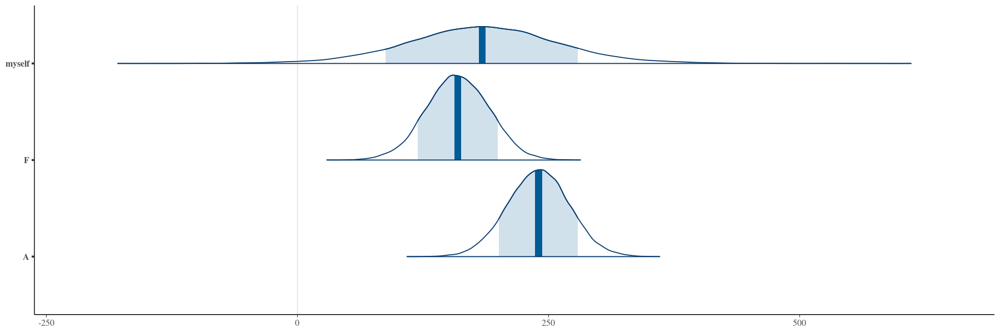

In [42]:
options(repr.plot.width=15, repr.plot.height=5)
mcmc_areas(predict_new_scenario, prob = 0.8) +
 ggplot2::scale_y_discrete(labels = c("A", "F", "myself"))

Since the between-group variability is larger than the within-group variability, as soon as the baseline pitch is known, the distributions are quite narrow (A and F). If the pitch is not known, the distributions are much wider (myself).

## Exercise 17.14

### Exploratory analysis

In [43]:
sample_n( coffee_ratings_small, 10 )

farm_name,total_cup_points,aroma,flavor,aftertaste,acidity,body,balance,uniformity,sweetness,moisture
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NA,82.58,7.58,7.50,7.42,7.58,7.67,7.42,10,10,0.11
NA,82.33,7.33,7.58,7.42,7.50,7.50,7.50,10,10,0.11
fazenda capoeirnha,83.92,7.50,7.75,7.58,7.50,7.58,7.50,10,10,0.00
NA,82.58,7.42,7.42,7.50,7.33,7.25,7.67,10,10,0.00
various,83.08,7.83,7.33,7.50,7.67,7.58,7.67,10,10,0.10
NA,83.75,7.75,7.67,7.50,7.67,7.58,7.83,10,10,0.00
NA,82.17,7.58,7.67,7.42,7.17,7.17,7.75,10,10,0.08
NA,83.08,7.83,7.75,7.33,7.25,7.42,7.92,10,10,0.08
el papaturro,83.83,7.58,7.83,7.33,8.00,7.58,7.75,10,10,0.10


In [44]:
dim( coffee_ratings_small )

[1] 636  11

In [45]:
coffee_ratings_small  %>% count(farm_name)

farm_name,n
<fct>,<int>
agropecuaria quiagral,8
apollo estate,5
bethel,7
capoeirinha,10
cerro bueno,8
conquista / morito,11
doi tung development project,13
el morito,8
el papaturro,9


Most of the farm names are missing.

Correlations:

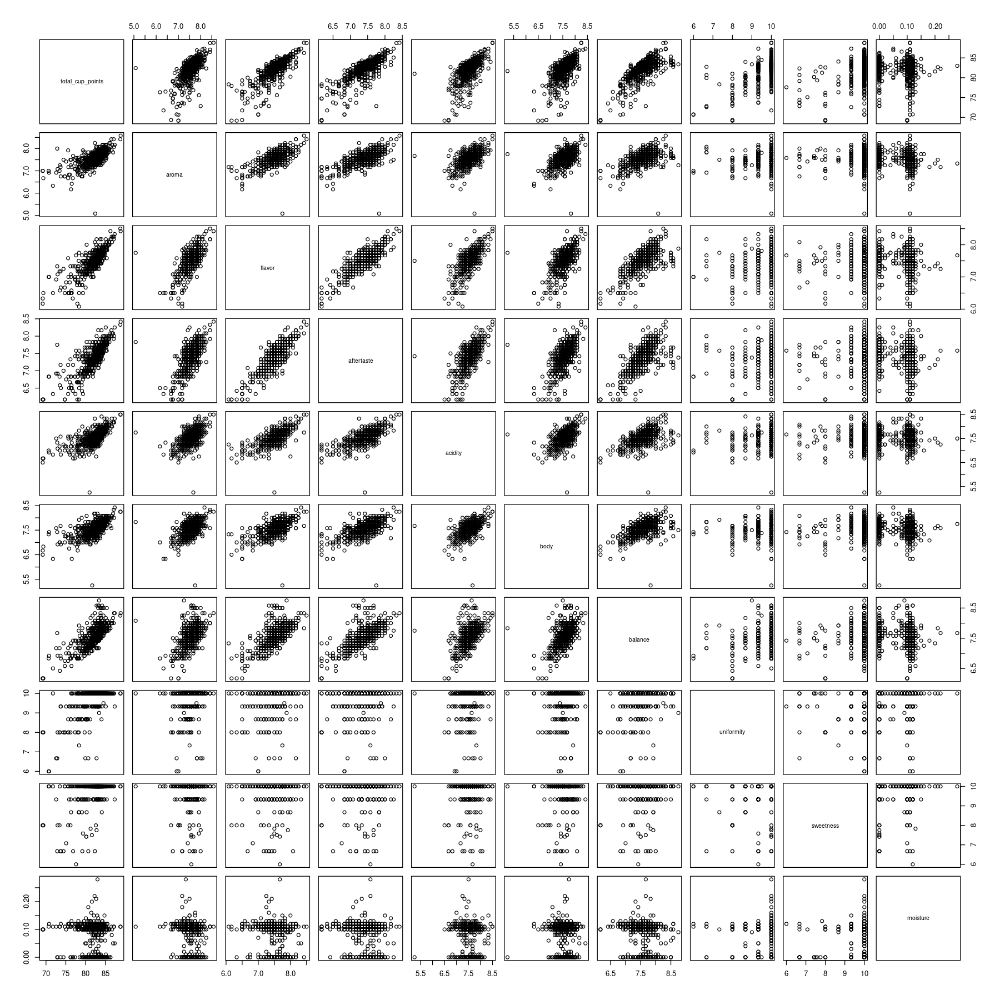

In [46]:
options(repr.plot.width=15, repr.plot.height=15)
pairs( coffee_ratings_small  %>% select_if( is.numeric ) )

In [47]:
cor( coffee_ratings_small  %>% select_if( is.numeric ) )

,total_cup_points,aroma,flavor,aftertaste,acidity,body,balance,uniformity,sweetness,moisture
total_cup_points,1.0000000,0.65681914,0.8015403,0.78574968,0.66177883,0.62615259,0.7431908,0.60613507,0.43420958,-0.11188081
aroma,0.6568191,1.00000000,0.6810691,0.64683561,0.54205056,0.51869435,0.5370028,0.16489703,0.04948655,-0.17164143
flavor,0.8015403,0.68106912,1.0000000,0.84272241,0.69323669,0.62554026,0.6823018,0.23541461,0.10927925,-0.14365932
aftertaste,0.7857497,0.64683561,0.8427224,1.00000000,0.67870509,0.62304193,0.6949127,0.20965934,0.09521006,-0.17606307
acidity,0.6617788,0.54205056,0.6932367,0.67870509,1.00000000,0.54324216,0.5520647,0.14510105,0.06173206,-0.09009386
body,0.6261526,0.51869435,0.6255403,0.62304193,0.54324216,1.00000000,0.5775420,0.08895302,0.06447216,-0.15556952
balance,0.7431908,0.53700281,0.6823018,0.69491270,0.55206465,0.57754195,1.0000000,0.25552979,0.10815129,-0.19383086
uniformity,0.6061351,0.16489703,0.2354146,0.20965934,0.14510105,0.08895302,0.2555298,1.00000000,0.34773920,0.01767382
sweetness,0.4342096,0.04948655,0.1092792,0.09521006,0.06173206,0.06447216,0.1081513,0.34773920,1.00000000,0.09889003
moisture,-0.1118808,-0.17164143,-0.1436593,-0.17606307,-0.09009386,-0.15556952,-0.1938309,0.01767382,0.09889003,1.00000000


Significant correlation among the predictors. Probably not all are necessary for a good model. Choose the following: uniformity, sweetness, moisture, flavor.

How to decide whether to use a model also with random slopes? Fit linear models for each subject!

`geom_smooth()` using formula = 'y ~ x'


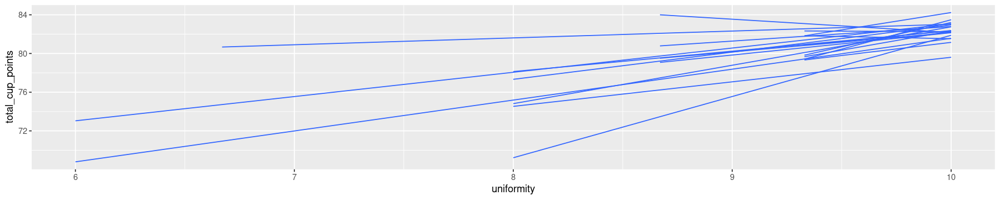

In [48]:
options(repr.plot.width=15, repr.plot.height=3)
ggplot(coffee_ratings_small, aes(x=uniformity, y=total_cup_points, group=farm_name)) + 
    geom_smooth(method="lm", se=FALSE, linewidth=0.5)

`geom_smooth()` using formula = 'y ~ x'


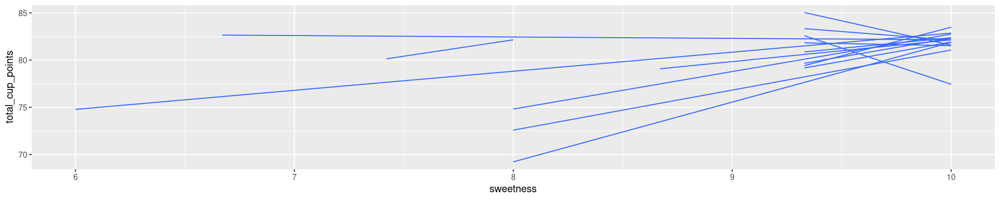

In [49]:
options(repr.plot.width=15, repr.plot.height=3)
ggplot(coffee_ratings_small, aes(x=sweetness, y=total_cup_points, group=farm_name)) + 
    geom_smooth(method="lm", se=FALSE, linewidth=0.5)

`geom_smooth()` using formula = 'y ~ x'


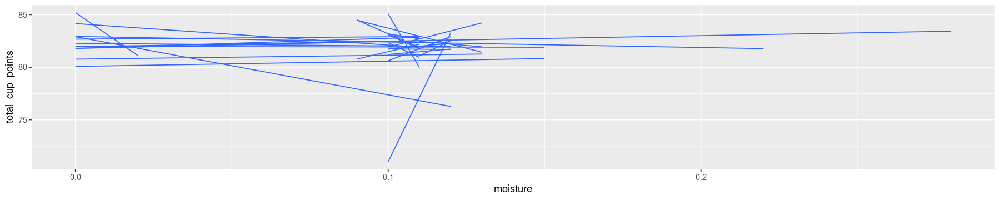

In [50]:
options(repr.plot.width=15, repr.plot.height=3)
ggplot(coffee_ratings_small, aes(x=moisture, y=total_cup_points, group=farm_name)) + 
    geom_smooth(method="lm", se=FALSE, linewidth=0.5)

`geom_smooth()` using formula = 'y ~ x'


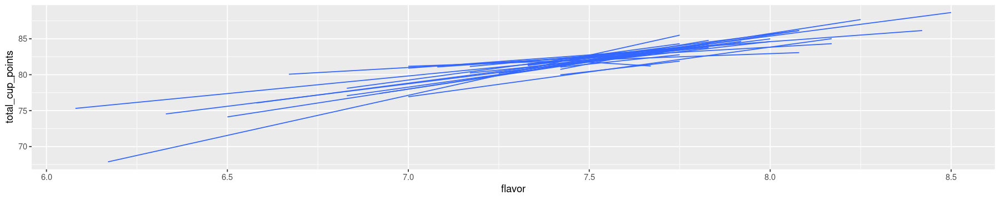

In [51]:
options(repr.plot.width=15, repr.plot.height=3)
ggplot(coffee_ratings_small, aes(x=flavor, y=total_cup_points, group=farm_name)) + 
    geom_smooth(method="lm", se=FALSE, linewidth=0.5)

Possibly, moisture and sweetness could be given individual slopes.

### Fit and simulate two models

In [52]:
coffee_model_1 <- stan_glmer(
  total_cup_points ~ uniformity + sweetness + moisture + flavor + (1 | farm_name), 
  data = coffee_ratings_small, family = gaussian,
  prior_intercept = normal(250, 10, autoscale = TRUE),
  prior = normal(0, 1, autoscale = TRUE), 
  prior_aux = exponential(1, autoscale = TRUE),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1),
  chains = 4, iter = 5000*2, seed = 84735
)

In [53]:
coffee_model_2 <- stan_glmer(
  total_cup_points ~ uniformity + sweetness + moisture + flavor + (moisture + sweetness | farm_name), 
  data = coffee_ratings_small, family = gaussian,
  prior_intercept = normal(250, 10, autoscale = TRUE),
  prior = normal(0, 1, autoscale = TRUE), 
  prior_aux = exponential(1, autoscale = TRUE),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1),
  chains = 4, iter = 5000*2, seed = 84735
)

Warning message:
“There were 18 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”


The second model takes longer on my laptop with four cores, if I wanted to include all predictors, this would take quite some time.. Regarding the warning: On https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup it says:

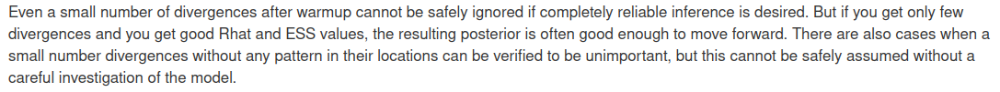

Let's check the diagnostics for both chains:

### MCMC diagnostics

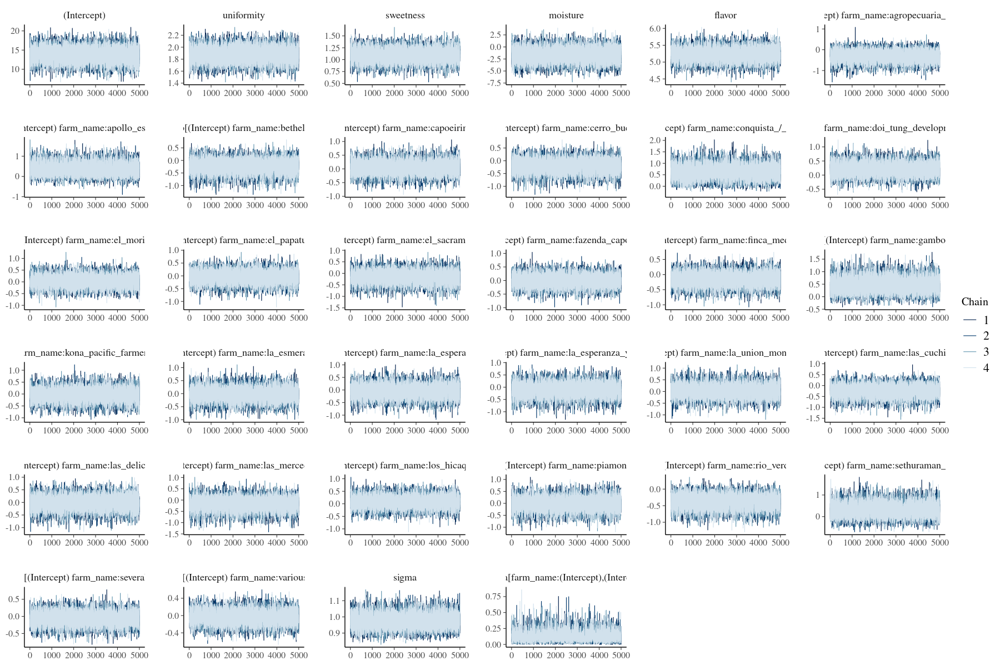

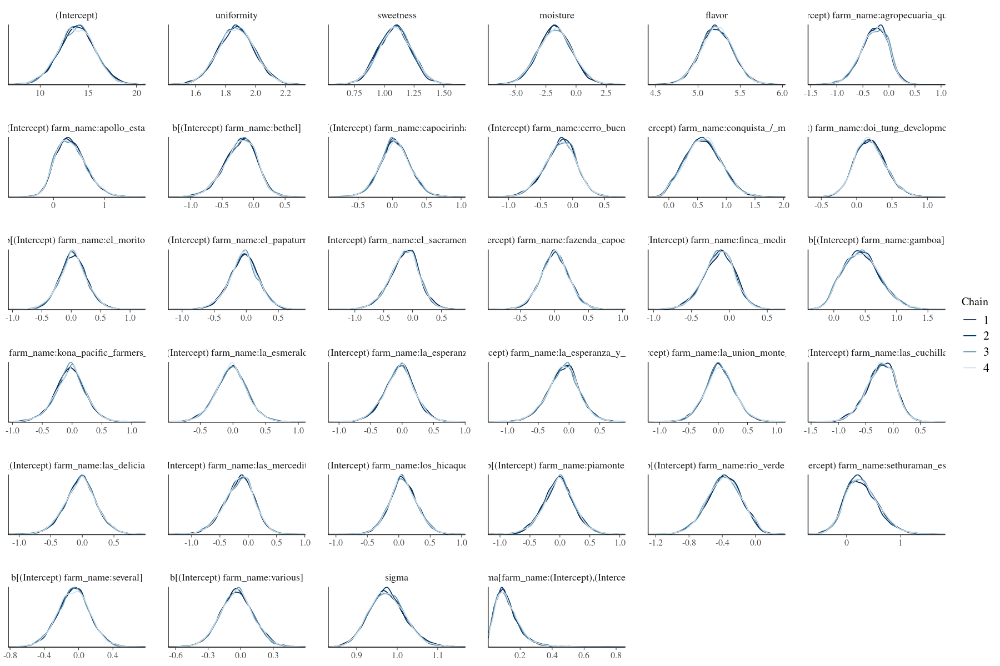

(Intercept) 
                                                  0.96105 
                                               uniformity 
                                                  0.90610 
                                                sweetness 
                                                  0.81095 
                                                 moisture 
                                                  0.96270 
                                                   flavor 
                                                  0.66650 
           b[(Intercept) farm_name:agropecuaria_quiagral] 
                                                  0.70880 
                   b[(Intercept) farm_name:apollo_estate] 
                                                  0.63165 
                          b[(Intercept) farm_name:bethel] 
                                                  0.90275 
                     b[(Intercept) farm_name:capoeirinha] 
                                                  1.14215 
                     b[(Intercept) farm_name:cerro_bueno] 
                                                  0.96395 
              b[(Intercept) farm_name:conquista_/_morito] 
                                                  0.36120 
    b[(Intercept) farm_name:doi_tung_development_project] 
                                                  0.87845 
                       b[(Intercept) farm_name:el_morito] 
                                                  1.15975 
                    b[(Intercept) farm_name:el_papaturro] 
                                                  1.11645 
                   b[(Intercept) farm_name:el_sacramento] 
                                                  0.94850 
              b[(Intercept) farm_name:fazenda_capoeirnha] 
                                                  1.02150 
                    b[(Intercept) farm_name:finca_medina] 
                                                  0.86865 
                          b[(Intercept) farm_name:gamboa] 
                                                  0.53170 
b[(Intercept) farm_name:kona_pacific_farmers_cooperative] 
                                                  1.14730 
                    b[(Intercept) farm_name:la_esmeralda] 
                                                  1.23320 
                    b[(Intercept) farm_name:la_esperanza] 
                                                  1.21490 
           b[(Intercept) farm_name:la_esperanza_y_anexos] 
                                                  1.24055 
            b[(Intercept) farm_name:la_union_monte_verde] 
                                                  1.24415 
                   b[(Intercept) farm_name:las_cuchillas] 
                                                  0.81175 
                    b[(Intercept) farm_name:las_delicias] 
                                                  1.21220 
                  b[(Intercept) farm_name:las_merceditas] 
                                                  0.95400 
                    b[(Intercept) farm_name:los_hicaques] 
                                                  1.09690 
                        b[(Intercept) farm_name:piamonte] 
                                                  1.29710 
                       b[(Intercept) farm_name:rio_verde] 
                                                  0.53975 
              b[(Intercept) farm_name:sethuraman_estates] 
                                                  0.62595 
                         b[(Intercept) farm_name:several] 
                                                  0.94230 
                         b[(Intercept) farm_name:various] 
                                                  0.71260 
                                                    sigma 
                                                  0.74940 
                 Sigma[farm_name:(Intercept),(Intercept)] 
                                                  0.31880

(Intercept) 
                                                1.0001448 
                                               uniformity 
                                                1.0003670 
                                                sweetness 
                                                1.0007004 
                                                 moisture 
                                                0.9999981 
                                                   flavor 
                                                1.0000409 
           b[(Intercept) farm_name:agropecuaria_quiagral] 
                                                1.0000035 
                   b[(Intercept) farm_name:apollo_estate] 
                                                0.9999579 
                          b[(Intercept) farm_name:bethel] 
                                                0.9999773 
                     b[(Intercept) farm_name:capoeirinha] 
                                                0.9999450 
                     b[(Intercept) farm_name:cerro_bueno] 
                                                1.0000927 
              b[(Intercept) farm_name:conquista_/_morito] 
                                                1.0000672 
    b[(Intercept) farm_name:doi_tung_development_project] 
                                                0.9999038 
                       b[(Intercept) farm_name:el_morito] 
                                                0.9999449 
                    b[(Intercept) farm_name:el_papaturro] 
                                                1.0000601 
                   b[(Intercept) farm_name:el_sacramento] 
                                                1.0000091 
              b[(Intercept) farm_name:fazenda_capoeirnha] 
                                                0.9999694 
                    b[(Intercept) farm_name:finca_medina] 
                                                1.0002413 
                          b[(Intercept) farm_name:gamboa] 
                                                0.9998743 
b[(Intercept) farm_name:kona_pacific_farmers_cooperative] 
                                                0.9998978 
                    b[(Intercept) farm_name:la_esmeralda] 
                                                0.9999260 
                    b[(Intercept) farm_name:la_esperanza] 
                                                0.9999323 
           b[(Intercept) farm_name:la_esperanza_y_anexos] 
                                                0.9999184 
            b[(Intercept) farm_name:la_union_monte_verde] 
                                                0.9999569 
                   b[(Intercept) farm_name:las_cuchillas] 
                                                1.0000104 
                    b[(Intercept) farm_name:las_delicias] 
                                                0.9998578 
                  b[(Intercept) farm_name:las_merceditas] 
                                                0.9999028 
                    b[(Intercept) farm_name:los_hicaques] 
                                                0.9999165 
                        b[(Intercept) farm_name:piamonte] 
                                                0.9999564 
                       b[(Intercept) farm_name:rio_verde] 
                                                1.0000725 
              b[(Intercept) farm_name:sethuraman_estates] 
                                                1.0006454 
                         b[(Intercept) farm_name:several] 
                                                1.0001054 
                         b[(Intercept) farm_name:various] 
                                                1.0000200 
                                                    sigma 
                                                0.9999328 
                 Sigma[farm_name:(Intercept),(Intercept)] 
                                                1.0003062

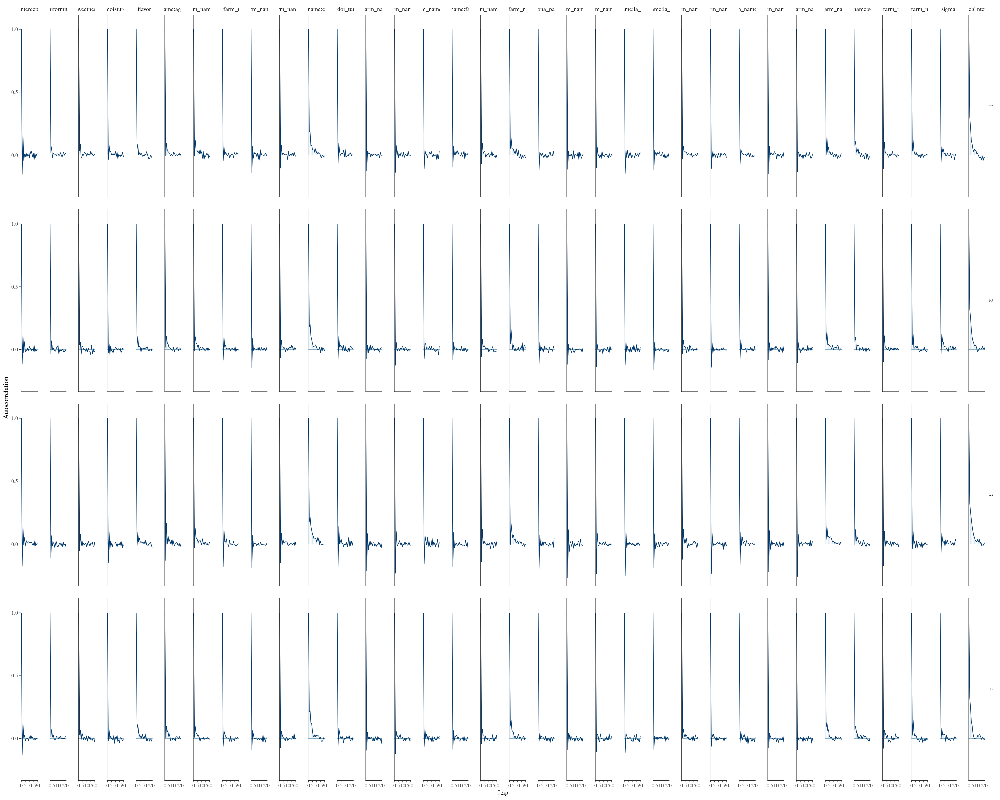

In [54]:
options(repr.plot.width=15, repr.plot.height=10)
mcmc_trace(coffee_model_1)
mcmc_dens_overlay(coffee_model_1)
options(repr.plot.width=25, repr.plot.height=20)
mcmc_acf(coffee_model_1)
neff_ratio(coffee_model_1)
rhat(coffee_model_1)

Diagnostics look good.

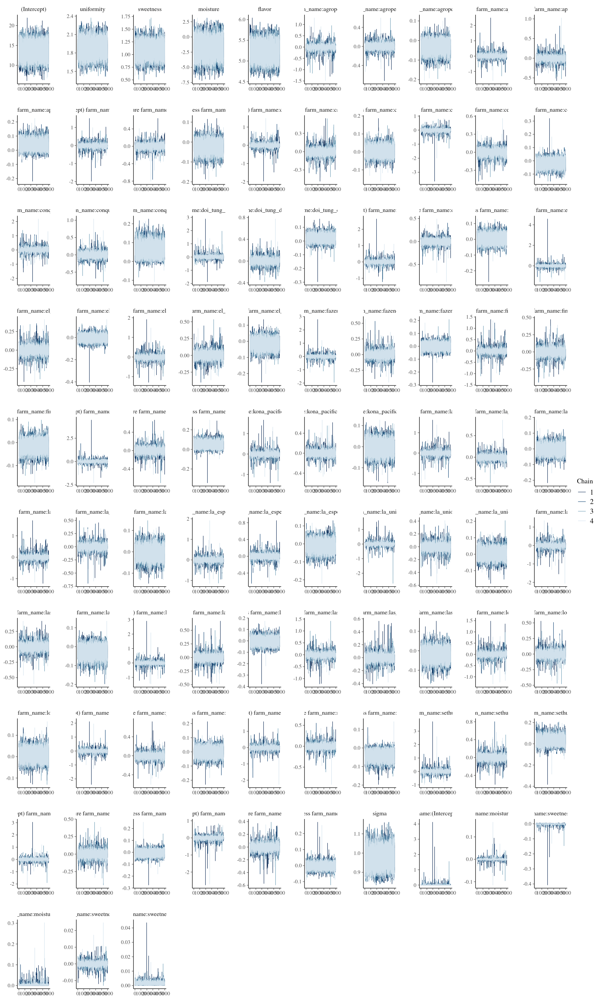

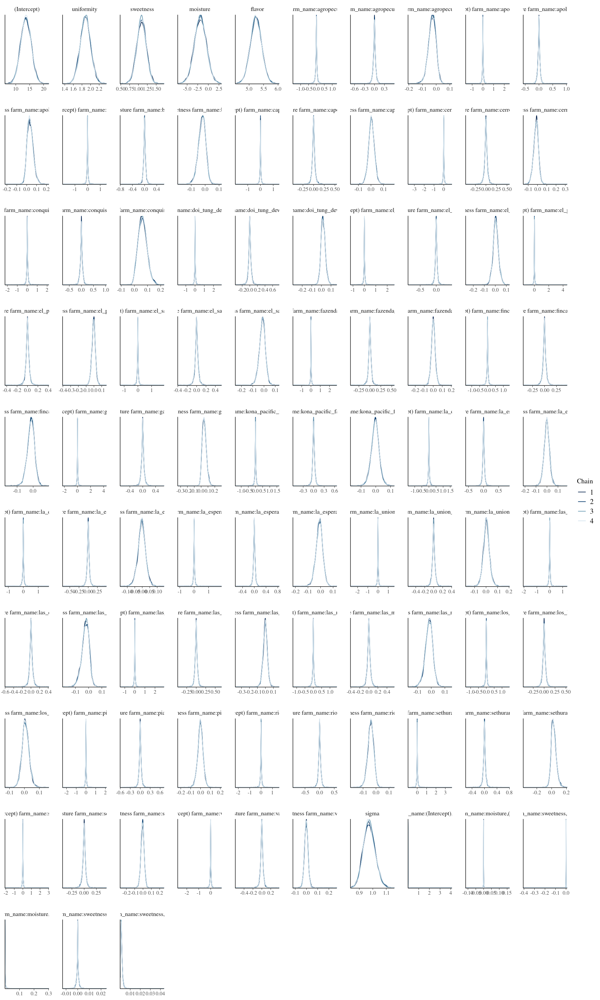

(Intercept) 
                                                  1.08505 
                                               uniformity 
                                                  1.18815 
                                                sweetness 
                                                  1.05285 
                                                 moisture 
                                                  1.26040 
                                                   flavor 
                                                  0.93525 
           b[(Intercept) farm_name:agropecuaria_quiagral] 
                                                  0.52660 
              b[moisture farm_name:agropecuaria_quiagral] 
                                                  0.53495 
             b[sweetness farm_name:agropecuaria_quiagral] 
                                                  0.79590 
                   b[(Intercept) farm_name:apollo_estate] 
                                                  0.44415 
                      b[moisture farm_name:apollo_estate] 
                                                  0.41435 
                     b[sweetness farm_name:apollo_estate] 
                                                  0.74740 
                          b[(Intercept) farm_name:bethel] 
                                                  0.66380 
                             b[moisture farm_name:bethel] 
                                                  0.60895 
                            b[sweetness farm_name:bethel] 
                                                  1.02055 
                     b[(Intercept) farm_name:capoeirinha] 
                                                  0.93845 
                        b[moisture farm_name:capoeirinha] 
                                                  0.82530 
                       b[sweetness farm_name:capoeirinha] 
                                                  1.32635 
                     b[(Intercept) farm_name:cerro_bueno] 
                                                  0.71295 
                        b[moisture farm_name:cerro_bueno] 
                                                  0.68925 
                       b[sweetness farm_name:cerro_bueno] 
                                                  1.11310 
              b[(Intercept) farm_name:conquista_/_morito] 
                                                  0.29565 
                 b[moisture farm_name:conquista_/_morito] 
                                                  0.30045 
                b[sweetness farm_name:conquista_/_morito] 
                                                  0.49420 
    b[(Intercept) farm_name:doi_tung_development_project] 
                                                  0.71760 
       b[moisture farm_name:doi_tung_development_project] 
                                                  0.61345 
      b[sweetness farm_name:doi_tung_development_project] 
                                                  1.03490 
                       b[(Intercept) farm_name:el_morito] 
                                                  0.90925 
                          b[moisture farm_name:el_morito] 
                                                  0.80495 
                         b[sweetness farm_name:el_morito] 
                                                  1.17875 
                    b[(Intercept) farm_name:el_papaturro] 
                                                  1.05835 
                       b[moisture farm_name:el_papaturro] 
                                                  0.85080 
                      b[sweetness farm_name:el_papaturro] 
                                                  1.21210 
                   b[(Intercept) farm_name:el_sacramento] 
                                                  0.79275 
                      b[moisture farm_name:el_sacramento] 
                                                  0.69770 
                     b[sweetness f

(Intercept) 
                                                0.9998829 
                                               uniformity 
                                                0.9999944 
                                                sweetness 
                                                1.0000617 
                                                 moisture 
                                                0.9998946 
                                                   flavor 
                                                1.0000108 
           b[(Intercept) farm_name:agropecuaria_quiagral] 
                                                1.0002996 
              b[moisture farm_name:agropecuaria_quiagral] 
                                                1.0001080 
             b[sweetness farm_name:agropecuaria_quiagral] 
                                                0.9999669 
                   b[(Intercept) farm_name:apollo_estate] 
                                                0.9998843 
                      b[moisture farm_name:apollo_estate] 
                                                0.9999436 
                     b[sweetness farm_name:apollo_estate] 
                                                0.9999912 
                          b[(Intercept) farm_name:bethel] 
                                                0.9999543 
                             b[moisture farm_name:bethel] 
                                                0.9999607 
                            b[sweetness farm_name:bethel] 
                                                1.0000504 
                     b[(Intercept) farm_name:capoeirinha] 
                                                0.9998982 
                        b[moisture farm_name:capoeirinha] 
                                                0.9999361 
                       b[sweetness farm_name:capoeirinha] 
                                                0.9998652 
                     b[(Intercept) farm_name:cerro_bueno] 
                                                1.0000967 
                        b[moisture farm_name:cerro_bueno] 
                                                1.0001958 
                       b[sweetness farm_name:cerro_bueno] 
                                                1.0000075 
              b[(Intercept) farm_name:conquista_/_morito] 
                                                1.0001775 
                 b[moisture farm_name:conquista_/_morito] 
                                                1.0001462 
                b[sweetness farm_name:conquista_/_morito] 
                                                1.0000931 
    b[(Intercept) farm_name:doi_tung_development_project] 
                                                1.0005715 
       b[moisture farm_name:doi_tung_development_project] 
                                                1.0000147 
      b[sweetness farm_name:doi_tung_development_project] 
                                                1.0001256 
                       b[(Intercept) farm_name:el_morito] 
                                                1.0003311 
                          b[moisture farm_name:el_morito] 
                                                1.0001259 
                         b[sweetness farm_name:el_morito] 
                                                0.9999985 
                    b[(Intercept) farm_name:el_papaturro] 
                                                0.9999774 
                       b[moisture farm_name:el_papaturro] 
                                                0.9999152 
                      b[sweetness farm_name:el_papaturro] 
                                                1.0000850 
                   b[(Intercept) farm_name:el_sacramento] 
                                                0.9998843 
                      b[moisture farm_name:el_sacramento] 
                                                1.0003828 
                     b[sweetness f

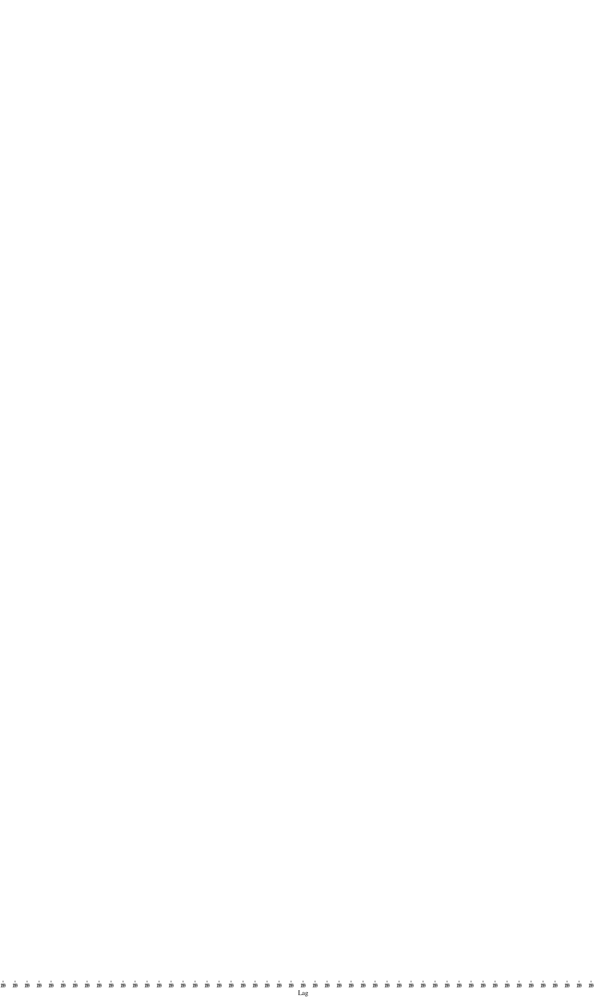

In [55]:
options(repr.plot.width=15, repr.plot.height=25)
mcmc_trace(coffee_model_2)
mcmc_dens_overlay(coffee_model_2)
mcmc_acf(coffee_model_2)
neff_ratio(coffee_model_2)
rhat(coffee_model_2)

There are some spikes (probably the divergences mentioned in the warning) in the trace plots. However the density plots and the rhat values seem to look fine. To do this properly, one would need to tweak the MCMC here, however I ignore this and continue.

### Posterior predictive check

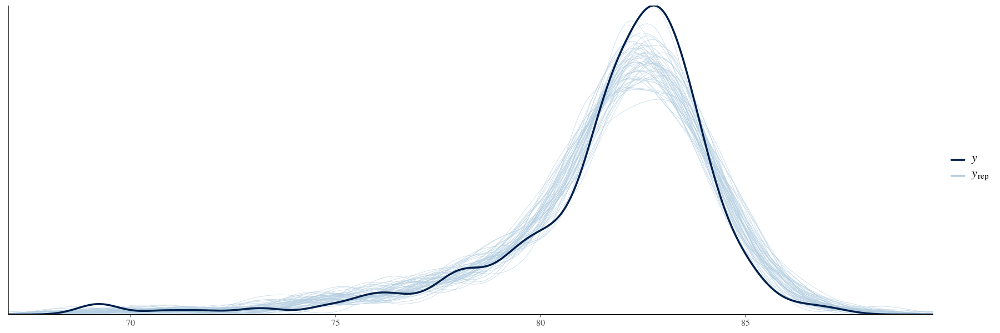

In [56]:
options(repr.plot.width=15, repr.plot.height=5)
pp_check(coffee_model_1)

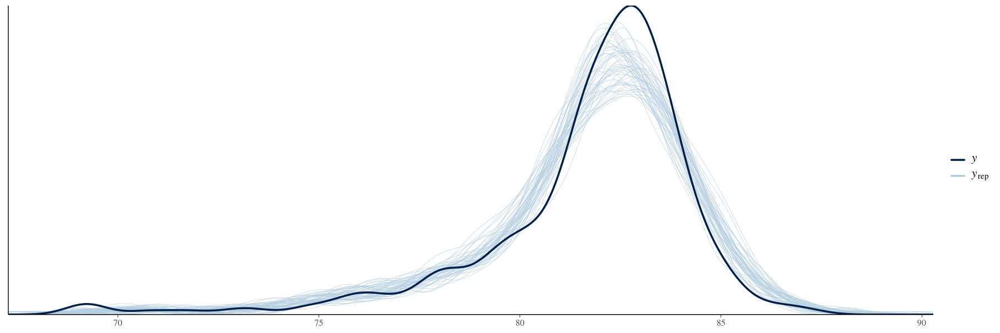

In [57]:
options(repr.plot.width=15, repr.plot.height=5)
pp_check(coffee_model_2)

Both models look more or less ok, the actual data distribution is a bit more narrow than the normal distribution.

### Compare model performances and select best model

In [58]:
prediction_summary(model = coffee_model_1, data = coffee_ratings_small %>% na.omit())

mae,mae_scaled,within_50,within_95
<dbl>,<dbl>,<dbl>,<dbl>
0.492829,0.4901873,0.6028881,0.967509


In [59]:
prediction_summary(model = coffee_model_2, data = coffee_ratings_small %>% na.omit())

mae,mae_scaled,within_50,within_95
<dbl>,<dbl>,<dbl>,<dbl>
0.4872059,0.4839024,0.6064982,0.967509


ELPD:

In [60]:
elpd1 <- loo(coffee_model_1, k_threshold=0.7)
elpd2 <- loo(coffee_model_2, k_threshold=0.7)
loo_compare(elpd1, elpd2)

1 problematic observation(s) found.
Model will be refit 1 times.


Fitting model 1 out of 1 (leaving out observation 213)

1 problematic observation(s) found.
Model will be refit 1 times.


Fitting model 1 out of 1 (leaving out observation 213)



,elpd_diff,se_diff,elpd_loo,se_elpd_loo,p_loo,se_p_loo,looic,se_looic
coffee_model_2,0.000000000,0.0000000,-399.1648,22.99400,24.19824,6.241245,798.3295,45.98801
coffee_model_1,-0.009263433,0.3397638,-399.1740,22.92296,23.89863,6.114573,798.3481,45.84593


No significant difference between the models, only use the simpler model 1 from now on.

### Global model parameters

In [61]:
tidy(coffee_model_1, effects = "fixed", conf.int = TRUE, conf.level = 0.80)

term,estimate,std.error,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),13.823647,1.8591744,11.3841299,16.17473545
uniformity,1.872590,0.1208561,1.7170889,2.02891949
sweetness,1.091369,0.1381829,0.9116501,1.26857769
moisture,-1.732304,1.4074539,-3.5386459,0.08841798
flavor,5.218879,0.1932896,4.9743177,5.47074034


**Global average model:**

Total cup points = 13.8 + uniformity * 1.9 + sweetness * 1.09 - 1.73 moisture + 5.2 * flavor

However the negative relationship with moisture seems not to be significant at the 80% level. The strongest contribution comes from flavor: Every point in flavor gives 5 points in total cup points.

### Variability

Which variability is larger, between-group (between all the farms) or within-group? (among one farm) ?

In [62]:
tidy(coffee_model_1, effects = "ran_pars")

term,group,estimate
<chr>,<chr>,<dbl>
sd_(Intercept).farm_name,farm_name,0.3490031
sd_Observation.Residual,Residual,0.9753836


In [63]:
sigma_y <- 0.97
sigma_0 <- 0.35

Proportion of variability explained by within-group variability:

In [64]:
sigma_y^2/(sigma_y^2 + sigma_0^2)

[1] 0.8848035

Proportion of variability explained by between-group variability:

In [65]:
sigma_0^2/(sigma_y^2 + sigma_0^2)

[1] 0.1151965

It appears that the coffee farm alone is not really an indicator for good coffee.

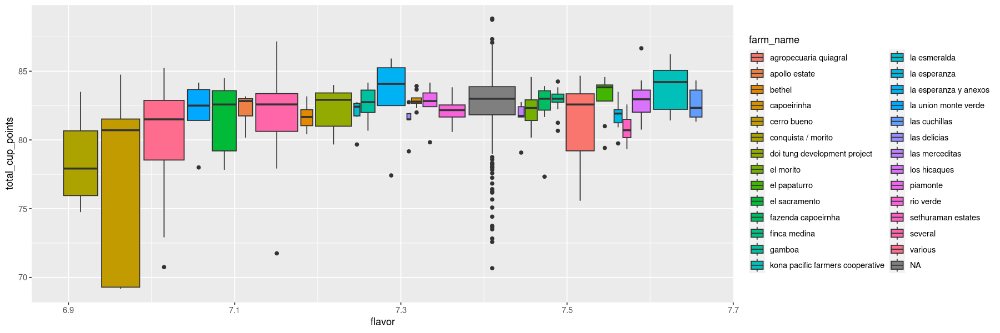

In [66]:
ggplot( coffee_ratings_small, aes(x=flavor, y=total_cup_points, fill=farm_name) ) + geom_boxplot()

### Which is the best farm, which the worst?

As explained above, the within-group variability dominates over between-group variability, so there are only small differences. Apparently `stan_glmer()` knows how to deal with missing data (most of the farm names are missing), I ran both simulations with and without `na.omit()` and got the same results.

In [67]:
coffee_summary <- coffee_model_1 %>%
  spread_draws(`(Intercept)`, b[,farm_name]) %>% # extract dataframe
  mutate(farm_name_intercept = `(Intercept)` + b) %>% # compute individual runner intercepts
  select(-`(Intercept)`, -b) %>% # drop global intercept and b
  median_qi(.width = 0.80) %>%  # compute credible intervals
  select(farm_name, farm_name_intercept, .lower, .upper)

coffee_summary %>% arrange( desc(farm_name_intercept) )

farm_name,farm_name_intercept,.lower,.upper
<chr>,<dbl>,<dbl>,<dbl>
farm_name:conquista_/_morito,14.42205,12.09255,16.67708
farm_name:gamboa,14.26745,11.86372,16.60838
farm_name:apollo_estate,14.15778,11.74936,16.51272
farm_name:sethuraman_estates,14.09430,11.75133,16.39570
farm_name:doi_tung_development_project,14.02498,11.57669,16.36636
farm_name:los_hicaques,13.89269,11.42540,16.26750
farm_name:capoeirinha,13.86473,11.39268,16.25867
farm_name:el_morito,13.86217,11.40091,16.23128
farm_name:la_union_monte_verde,13.85489,11.40129,16.24049


## Exercise 17.15

### Prior elicitation

For the chosen hierarchical random intercept model:

\begin{eqnarray*}
Y_{ij}|\beta_{0j},\beta_1,\sigma_y &\sim& N(\mu_{ij}, \sigma_y^2) \quad \text{with} \quad \mu_{ij} = \beta_{0j} + \beta_{1} X _{ij}\\
\beta_{0j} |\beta_0, \sigma_0 &\sim & N\left( \beta_0, \sigma_0^2 \right)\\
\beta_{0c} &=& N(m_0, s_0^2) \\
\beta_1 &=& N(0, s_1^2)\\
\sigma_y &=& \text{Exp}(l_y) \\
\sigma_0 &=& \text{Exp}(l_0)
\end{eqnarray*}

Average reaction time is probably less than half a second for all the participants, however also larger than 100 ms:

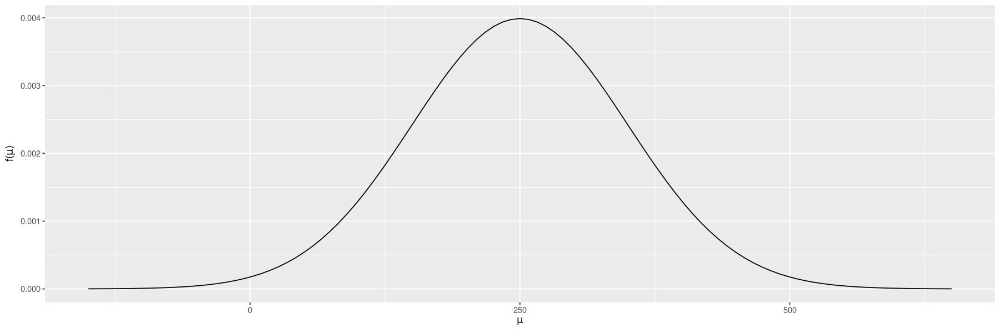

In [68]:
plot_normal( mean=250, sd=100 )

With my very weak knowledge: The increase of reaction time per day is certainly only a part of the full baseline reaction time and probably not more than 50$\mu$s per day on average. A decrease in reaction time should be an expection. This is difficult to model, as choosing too large slopes here might lead to many prior models with a negative intercept. Do do this analysis in a theoretically more sound way, one should use a prior distribution that makes sure that intercepts are only positive, however this normal model appears to be useful nevertheless.

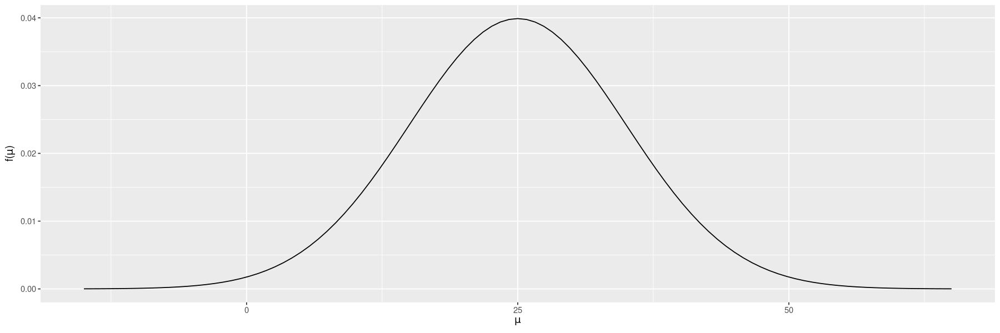

In [69]:
plot_normal( mean=25, sd=10 )

As mean within-group variability, I expect around $\sigma_y \sim 100\mu$s: $l_y = 1/100$. As mean between-group variability I expect around $\sigma_0 \sim 200\mu$s: $l_0 = 1/200$. Now things get a bit fuzzier and I am not perfectly sure if this is the right solution. If I understood things correctly, the `reg` and `conc` parameters of `decov` are not important here, since we do not have to model $\sigma_1$ and hence not a multivariate normal distribution, but only the boundary case of an univariate one. The `shape` and `scale` parameters are related to the prior for $\sigma_0$ (that should be equal to $\tau$): $\text{Gamma}(1,\lambda) = \text{Exp}(\lambda)$. Thus I use `decov(reg=1, conc=1, shape=1, scale=1/200)`.

### Prior simulation

In [70]:
sleep_model_priors <- stan_glmer(
  Reaction ~ Days + (1 | Subject), 
  data = sleepstudy, family = gaussian,
  prior_intercept = normal(250, 100),
  prior = normal(25, 10), 
  prior_aux = exponential(1/100),
  prior_covariance = decov(reg = 1, conc = 1, shape = 1, scale = 1/200),
  chains = 4, iter = 5000*2, seed = 84735,
  prior_PD = TRUE
)

### Checkout prior models

Warning message:
“`fitted_draws` and `add_fitted_draws` are deprecated as their names were confusing.
- Use [add_]epred_draws() to get the expectation of the posterior predictive.
- Use [add_]linpred_draws() to get the distribution of the linear predictor.
- For example, you used [add_]fitted_draws(..., scale = "response"), which
  means you most likely want [add_]epred_draws(...).
NOTE: When updating to the new functions, note that the `model` parameter is now
  named `object` and the `n` parameter is now named `ndraws`.”


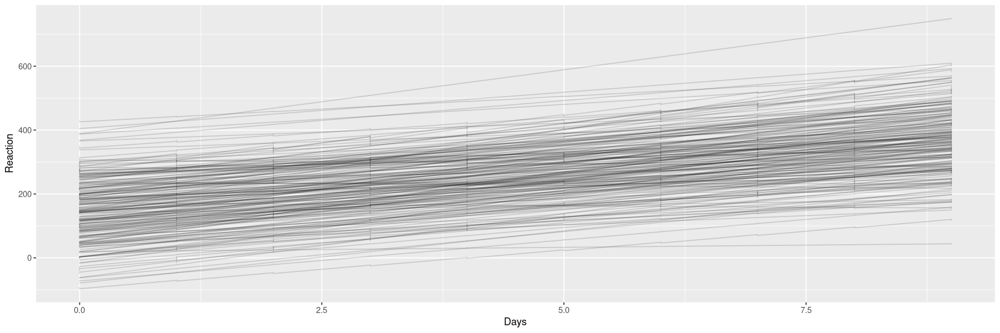

In [71]:
sleepstudy %>%
  add_fitted_draws(sleep_model_priors, n = 200) %>%
  ggplot(aes(x = Days, y = Reaction)) +
    geom_line(aes(y = .value, group = .draw), alpha = 0.15)

Simulate a few datasets:

Warning message:
“
In add_predicted_draws(): The `n` argument is a deprecated alias for `ndraws`.
Use the `ndraws` argument instead.
See help("tidybayes-deprecated").
”


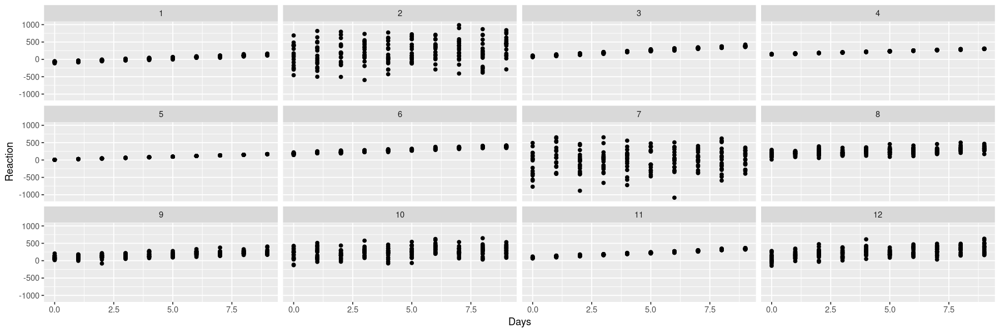

In [72]:
sleepstudy %>%
  add_predicted_draws(sleep_model_priors, n = 12) %>%
  ggplot(aes(x = Days, y = Reaction)) +
    geom_point(aes(y = .prediction, group = .draw)) + 
    facet_wrap(~ .draw)

Looks more or less reasonable.